<a href="https://colab.research.google.com/github/gnganesh99/BO-for-AutoSTM/blob/main/BO_on_STM_toy_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
!pip install SciFiReaders
!pip install pyNSID
!pip install sidpy



#Restart the runtime after first time installation

In [1]:
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

import warnings
import SciFiReaders
import numpy as np
import h5py
import matplotlib.pylab as plt
import numpy as np
import pyNSID
import gdown
import sidpy

warnings.filterwarnings("ignore", module="numpy.core.fromnumeric")
warnings.filterwarnings("ignore", module="pyNSID.io.nsi_reader")

You don't have igor2 installed.     If you wish to open igor files, you will need to install it     (pip install igor2) before attempting.
You don't have gwyfile installed.     If you wish to open .gwy files, you will need to      install it (pip install gwyfile) before attempting.


In [5]:
#Download data:
#https://drive.google.com/file/d/1YzyqL1pbvSakpEi4mPqGv0_vzsU-lXDF/view?usp=sharing

!gdown https://drive.google.com/uc?id=1YzyqL1pbvSakpEi4mPqGv0_vzsU-lXDF
meta_file_name = "stm_scans_fig3_1.hf5"

hf = h5py.File(meta_file_name, 'r+')
print(*hf["Measurement_000"].keys())
dataset_hdf5  =  pyNSID.io.hdf_utils.find_dataset(hf,'height_spectrum')[0]
hf.close()

dr = SciFiReaders.NSIDReader(meta_file_name)
#dr.view_metadata()
dataset_sid = dr.read()[0]
print(dataset_sid)
assert isinstance(dataset_sid, sidpy.Dataset)
#dataset_sid.plot()

Downloading...
From: https://drive.google.com/uc?id=1YzyqL1pbvSakpEi4mPqGv0_vzsU-lXDF
To: /content/stm_scans_fig3_1.hf5
100% 16.3M/16.3M [00:00<00:00, 152MB/s]
Channel_Height
sidpy.Dataset of type SPECTRAL_IMAGE with:
 dask.array<array, shape=(31, 256, 256), dtype=float64, chunksize=(31, 256, 256), chunktype=numpy.ndarray>
 data contains: Height (nm)
 and Dimensions: 
Frame:  scan image (channel_id) of size (31,)
x:  Length (nm) of size (256,)
y:  Length (nm) of size (256,)
 with metadata: ['channel_information']


In [4]:
!pip install --upgrade torch==1.8.1 torchvision==0.9.1
!pip install gpytorch botorch
!pip install smt

ERROR: Could not find a version that satisfies the requirement torch==1.8.1 (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0, 2.0.1)
ERROR: No matching distribution found for torch==1.8.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.1/266.1 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 567.8/567.8 kB 34.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.6/175.6 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 732.8/732.8 kB 56.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.5/174.5 kB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 822.1/822.1 kB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyDOE2: filename=pyDOE2-1.3.0-py3-none-any.whl size=25521 sha256=f5632b35bcb05edc372f2e99f7f353d273fb0d6533be1799e259b80acdb18ead
  Stored in directory: /root/.cache/pip/wheels/46/1f/29/6fda5c72f950841e39147ae603780ee913a62f977b4ad47ee4
Successfully bu

In [6]:
import sys
import gdown
import torch
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import pickle
import random

# Import GP and BoTorch functions
import gpytorch as gpt
import pandas as pd
from botorch.models import SingleTaskGP, ModelListGP
#from botorch.models import gpytorch
from botorch.fit import fit_gpytorch_model
from botorch.models.gpytorch import GPyTorchModel
from botorch.utils import standardize
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import ScaleKernel, RBFKernel, MaternKernel, PeriodicKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean, LinearMean
from gpytorch.mlls import ExactMarginalLogLikelihood
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.constraints import GreaterThan
from gpytorch.models import ExactGP
from mpl_toolkits.axes_grid1 import make_axes_locatable
from smt.sampling_methods import LHS
from torch.optim import SGD
from torch.optim import Adam
from scipy.stats import norm
#import time



In [40]:
# Fitting of the GP model with the help of the base kernel

class SimpleCustomGP(ExactGP, GPyTorchModel):
    _num_outputs = 1    # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y):
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        #self.mean_module = LinearMean(train_X.shape[-1])
        self.covar_module = ScaleKernel(
            #base_kernel=MaternKernel(nu=2.5, ard_num_dims=train_X.shape[-1]),
            base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
            #base_kernel=PeriodicKernel(ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)

# Optimization of the hyperparamter of the GP model

def optimize_hyperparam_trainGP(train_X, train_Y):
    # Gp model fit

    #train_X.detach().numpy()
    #train_Y.detach().numpy()

    gp_surro = SimpleCustomGP(train_X, train_Y)
    gp_surro = gp_surro.double()
    gp_surro.likelihood.noise_covar.register_constraint("raw_noise", GreaterThan(1e-1))
    mll1 = ExactMarginalLogLikelihood(gp_surro.likelihood, gp_surro)

    # fit_gpytorch_model(mll)
    mll1 = mll1.to(train_X)
    gp_surro.train()
    gp_surro.likelihood.train()
    ## Here we use Adam optimizer with learning rate =0.1, user can change here with different algorithm and/or learning rate for each GP
    optimizer1 = Adam([{'params': gp_surro.parameters()}], lr = 0.1) #0.01 set for BEPFM data, recommended to check the lr for any new data
    #optimizer1 = SGD([{'params': gp_surro.parameters()}], lr=0.0001)

    NUM_EPOCHS = 150

    for epoch in range(NUM_EPOCHS):
        # clear gradients
        optimizer1.zero_grad()
        # forward pass through the model to obtain the output MultivariateNormal
        output1 = gp_surro(train_X)
        # Compute negative marginal log likelihood
        loss1 = - mll1(output1, gp_surro.train_targets)
        # back prop gradients
        #loss1.backward(retain_graph=True)
        # print last iterations
        if (epoch + 1) > NUM_EPOCHS: #Stopping the print for now
            print("GP Model trained:")
            print("Iteration:" + str(epoch + 1))
            print("Loss:" + str(loss1.item()))
            # print("Length Scale:" +str(gp_PZO.covar_module.base_kernel.lengthscale.item()))
            print("noise:" + str(gp_surro.likelihood.noise.item()))

        optimizer1.step()

    gp_surro.eval()
    gp_surro.likelihood.eval()
    return gp_surro

def cal_posterior(gp_surro, test_X):
    y_pred_means = torch.empty(len(test_X), 1)
    y_pred_vars = torch.empty(len(test_X), 1)
    t_X = torch.empty(1, test_X.shape[1])
    for t in range(0, len(test_X)):
        with torch.no_grad(), gpt.settings.max_lanczos_quadrature_iterations(32), \
            gpt.settings.fast_computations(covar_root_decomposition=False, log_prob=False,
                                                      solves=True), \
            gpt.settings.max_cg_iterations(100), \
            gpt.settings.max_preconditioner_size(80), \
            gpt.settings.num_trace_samples(128):

                t_X[:, 0] = test_X[t, 0]
                t_X[:, 1] = test_X[t, 1]
                #t_X = test_X.double()

                y_pred_surro = gp_surro.posterior(t_X)
                y_pred_means[t, 0] = y_pred_surro.mean
                y_pred_vars[t, 0] = y_pred_surro.variance

    return y_pred_means, y_pred_vars
'''

def acqmanEI(y_means, y_vars, train_Y, ieval):
    y_means = y_means.detach().numpy()
    y_vars = y_vars.detach().numpy()
    y_std = np.sqrt(y_vars)

    fmax = train_Y.max()
    fmax = fmax.detach().numpy()
    best_value = fmax
    EI_val = np.zeros(len(y_vars))
    Z = np.zeros(len(y_vars))
    eta = 0.001

    for i in range(0, len(y_std)):
        if (y_std[i] <= 0):
            EI_val[i] = 0
        else:
            #Z[i] =  (y_means[i]-best_value-eta)/y_std[i]   # this is the gamma function
            Z[i] =  (best_value - y_means[i] + eta)/y_std[i]   # for minimization
            #print(best_value)
            #EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])   # This is the acquisition function
            EI_val[i] = (best_value - y_means[i] + eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])    # for minimization



    # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
    #ieval = np.asarray(ieval)
    EI_val[ieval] = -1          # setting it to -1 would render the acq value very low.


    acq_val = EI_val.max()
    acq_cand = [k for (k, j) in enumerate(EI_val) if j == acq_val]
    #print(acq_val)
    return acq_cand, acq_val, EI_val


def acqman_UCB(y_means, y_vars, train_Y, ieval, beta):
    y_means = y_means.detach().numpy()
    y_vars = y_vars.detach().numpy()
    y_std = np.sqrt(y_vars)


    fmax = train_Y.max()
    fmax = fmax.detach().numpy()
    best_value = fmax

    UCB_val = np.zeros(len(y_vars))

    Z = np.zeros(len(y_vars))
    eta = 0.0001

    for i in range(0, len(y_std)):
        if (y_std[i] <= 0):
            UCB_val[i] = 0
        else:
            UCB_val[i] = y_means[i] + beta * y_std[i]   # This is the acquisition function




    # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
    #ieval = np.asarray(ieval)
    UCB_val[ieval] = -1          # setting it to -1 would render the acq value very low.


    acq_val = UCB_val.max()
    acq_cand = [k for (k, j) in enumerate(UCB_val) if j == acq_val]
    #print(acq_val)
    return acq_cand, acq_val, UCB_val
'''
def estimate (train_X, train_Y, test_X, y_pred_means):
    #Best solution among the evaluated data
    loss = torch.max(train_Y)
    ind = torch.argmax(train_Y)
    X_opt = torch.empty((1,2))
    X_opt[0, 0] = train_X[ind, 0]
    X_opt[0, 1] = train_X[ind, 1]

    # Best estimated solution from GP model considering the non-evaluated solution
    loss = torch.max(y_pred_means)
    ind = torch.argmax(y_pred_means)
    X_opt_GP = torch.empty((1,2))
    X_opt_GP[0, 0] = test_X[ind, 0]
    X_opt_GP[0, 1] = test_X[ind, 1]

    return X_opt, X_opt_GP

#Plotting function wrt the GP generated funtion
def plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_opt, X_opt_GP, i):
    pen = 10**0
    #Objective map
    fig,ax=plt.subplots(ncols=2,figsize=(12,5))

    a = ax[0].scatter(test_X[:,0], test_X[:,1], c=y_pred_means, cmap='viridis', linewidth=0.2)
    ax[0].scatter(train_X[:,0], train_X[:,1], marker='s', c=train_Y, cmap='jet', linewidth=0.2)
    ax[0].scatter(X_opt[0, 0], X_opt[0, 1], marker='x', c='r')
    ax[0].scatter(X_opt_GP[0, 0], X_opt_GP[0, 1], marker='o', c='r')
    divider = make_axes_locatable(ax[0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(a, cax=cax, orientation='vertical')
    ax[0].set_title('Objective (GP mean) map', fontsize=10)
    #ax[0].axes.xaxis.set_visible(False)
    #ax[0].axes.yaxis.set_visible(False)
    #ax[0].colorbar(a)

    b = ax[1].scatter(test_X[:,0], test_X[:,1], c=y_pred_vars, cmap='viridis', linewidth=0.2)
    divider = make_axes_locatable(ax[1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(b, cax=cax, orientation='vertical')
    ax[1].set_title('Objective (GP var) map', fontsize=10)
    #ax[1].axes.xaxis.set_visible(False)
    #ax[1].axes.yaxis.set_visible(False)
    #ax[1].colorbar(b)

    #plt.savefig('ucb_beta100_=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
    #plt.show()


def point_average(points, array):
  p_average = []

  for i in range(len(array)):
    if i+1 < points:
      k = i+1
    else:
      k = points

    sum = 0
    for j in range(k):
      sum += array[i-j]

    p_average.append(sum/k)

  return p_average

In [8]:
def acqmanEI(y_means, y_vars, train_Y, ieval):
    y_means = y_means.detach().numpy()
    y_vars = y_vars.detach().numpy()
    y_std = np.sqrt(y_vars)

    fmax = train_Y.max()
    fmax = fmax.detach().numpy()
    best_value = fmax
    EI_val = np.zeros(len(y_vars))
    Z = np.zeros(len(y_vars))
    eta = 0.01


    y_means_norm = (y_means - np.min(y_means)) / (np.max(y_means) - np.min(y_means))
    best_value_norm = (best_value - np.min(y_means)) / (np.max(y_means) - np.min(y_means))


    for i in range(0, len(y_std)):
        if (y_std[i] <= 0):
            EI_val[i] = 0
        else:
            #Z[i] =  (y_means[i]-best_value-eta)/y_std[i]   # this is the gamma function, for maximization
            #Z[i] =  (best_value - y_means[i] + eta)/y_std[i]   # for minimization
            Z[i] =  (y_means_norm[i]-best_value_norm-eta)/y_std[i]

            #print(best_value)
            #EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])   # This is the acquisition function
            #EI_val[i] = (best_value - y_means[i] + eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])    # for minimization
            EI_val[i] = (y_means_norm[i]-best_value_norm-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])


    # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
    #ieval = np.asarray(ieval)
    EI_val[ieval] = -1          # setting it to -1 would render the acq value very low.


    acq_val = EI_val.max()
    acq_cand = [k for (k, j) in enumerate(EI_val) if j == acq_val]
    #print(acq_val)
    return acq_cand, acq_val, EI_val

def acqmanPI(y_means, y_vars, train_Y, ieval):
    y_means = y_means.detach().numpy()
    y_vars = y_vars.detach().numpy()
    y_std = np.sqrt(y_vars)

    fmax = train_Y.max()
    fmax = fmax.detach().numpy()
    best_value = fmax
    PI_val = np.zeros(len(y_vars))
    Z = np.zeros(len(y_vars))
    eta = 0.001


    y_means_norm = (y_means - np.min(y_means)) / (np.max(y_means) - np.min(y_means))
    best_value_norm = (best_value - np.min(y_means)) / (np.max(y_means) - np.min(y_means))


    for i in range(0, len(y_std)):
        if (y_std[i] <= 0):
            PI_val[i] = 0
        else:
            #Z[i] =  (y_means[i]-best_value-eta)/y_std[i]   # this is the gamma function, for maximization
            #Z[i] =  (best_value - y_means[i] + eta)/y_std[i]   # for minimization
            Z[i] =  (y_means_norm[i]-best_value_norm-eta)/y_std[i]

            #print(best_value)
            #EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])   # This is the acquisition function
            #EI_val[i] = (best_value - y_means[i] + eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])    # for minimization
            PI_val[i] = norm.cdf(Z[i])
            #print(Z[i], PI_val[i])


    # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
    #ieval = np.asarray(ieval)
    PI_val[ieval] = -1          # setting it to -1 would render the acq value very low.


    acq_val = PI_val.max()
    acq_cand = [k for (k, j) in enumerate(PI_val) if j == acq_val]

    #print('acq_cand = ',acq_cand)
    return acq_cand, acq_val, PI_val

def acqman_UCB(y_means, y_vars, train_Y, ieval, beta):
    y_means = y_means.detach().numpy()
    y_vars = y_vars.detach().numpy()
    y_std = np.sqrt(y_vars)




    fmax = train_Y.max()
    fmax = fmax.detach().numpy()
    best_value = fmax


    UCB_val = np.zeros(len(y_vars))

    Z = np.zeros(len(y_vars))


    for i in range(0, len(y_std)):
        if (y_std[i] <= 0):
            UCB_val[i] = 0
        else:
            UCB_val[i] = y_means[i] + beta * y_std[i]   # This is the acquisition function




    # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
    #ieval = np.asarray(ieval)
    UCB_val[ieval] = -1          # setting it to -1 would render the acq value very low.


    acq_val = UCB_val.max()
    acq_cand = [k for (k, j) in enumerate(UCB_val) if j == acq_val]
    #print(acq_val)
    return acq_cand, acq_val, UCB_val


In [29]:
def parameter_prediction(bias_array, setpoint_array, fft_p_array, index_array):

    #os.chdir(r"D:\scripts for labview\files\other")
    #file_name = str(file_string)

    #data = pd.read_csv(file_name, delimiter = "\t", skiprows = 1, header = None)

    idx_temp = []

    x_1t = bias_array
    x_2t = setpoint_array
    y_t = fft_p_array




    idx = index_array

    x1 = torch.asarray(x_1t)
    x2 = torch.asarray(x_2t)

    train_X = torch.vstack((x1, x2))
    train_X = torch.transpose(train_X, 0, 1)

    Y = torch.asarray(y_t)
    train_Y = Y

    #print('train_x = ',train_X)


    # Generate high resolution grid space for exploration
    B= torch.linspace(0.01, 0.11, 50)     # The bias space ranging from 10 mV to 110 mV
    SP= torch.linspace(400, 2000, 50)       # The setpoint space ranging from 400 pA to 2000 pA
    X= [B, SP]
    X_feas = torch.empty((X[0].shape[0]*X[1].shape[0], 2))
    k=0

    for t1 in range(0, X[0].shape[0]):
        for t2 in range(0, X[1].shape[0]):
            X_feas[k, 0] = X[0][t1]
            X_feas[k, 1] = X[1][t2]
            k=k+1

    X_feas_norm = torch.empty((X_feas.shape[0], X_feas.shape[1]))
    train_X_norm = torch.empty((train_X.shape[0], train_X.shape[1]))

    # Normalize X
    for i in range(0, X_feas.shape[1]):
        X_feas_norm[:, i] = (X_feas[:, i] - torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) - torch.min(X_feas[:, i]))

    for i in range(0, train_X.shape[1]):
        train_X_norm[:, i] = (train_X[:, i] - torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) - torch.min(X_feas[:, i]))

    test_X, test_X_norm = X_feas, X_feas_norm

    #print(len(train_X))


    ## Gp model fit
    N = 1
    m = train_X.shape[0]
    gp_surro = optimize_hyperparam_trainGP(train_X_norm, train_Y)



    #params = 1 # Here we will define all the other params fixed for scanning at STM
    for i in range(1, N + 1):
        print("step: ", i)
        print("Sample #" + str(m + 1)+ "\n\n")
        # Calculate posterior for analysis for intermidiate iterations
        y_pred_means, y_pred_vars = cal_posterior(gp_surro, test_X_norm)
        if ((i == 1) or ((i % 10) == 0)):
            # Plotting functions to check the current state exploration and Pareto fronts
            # X_eval, X_GP = play_varTBO.plot_iteration_results(train_X, train_Y, test_X, y_pred_means,
            #                                            y_pred_vars, new_spec_x, new_spec_y, img, i)
            X_eval, X_GP = estimate(train_X, train_Y, test_X, y_pred_means)

            plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_eval, X_GP, len(x1))

        #print(f'y_pred_means = {y_pred_means}, y_pred_vars = {y_pred_vars}, train_Y = {train_Y}, idx = {idx}')
        print(f'maximum y_means, trainY_max = {y_pred_means.max(), train_Y.max()}')





        acq_cand, acq_val, EI_val = acqmanEI(y_pred_means, y_pred_vars, train_Y, idx)
        #acq_cand, acq_val, UCB_values = acqman_UCB(y_pred_means, y_pred_vars, train_Y, idx, 100)
        #acq_cand, acq_val, PI_val = acqmanPI(y_pred_means, y_pred_vars, train_Y, idx)





        #print(len(acq_cand))
        val = acq_val
        print(f'acq_val = {acq_val}')
        ind = np.random.choice(acq_cand) # When multiple points have same acq values

        idx = np.hstack((idx, ind))   # This concatenates the present one to the list of indices
        #print(idx)
        #if i == 1:
            #idx = int(idx)
        print(idx, ind)  # Index in the exploration space


        ## Find next point which maximizes the learning through exploration-exploitation
        if (i == 1):
            val_ini = val
          # Check for convergence
        if ((val) < 0):  # Stop for negligible expected improvement
            print("Model converged due to sufficient learning over search space ")
            break
        else:
            nextX = torch.empty((1, 2))
            nextX_norm = torch.empty(1, 2)
            nextX[0,:] = test_X[ind, :]
            nextX_norm [0, :] = test_X_norm[ind, :]
            idx_x = int(nextX[0, 0])
            idx_y = int(nextX[0, 1])

    controls_array = []
    controls_array_1 = []
    controls_array.append(round(nextX.numpy()[0][0], 3))
    controls_array.append(round(nextX.numpy()[0][1], 3))
    controls_array.append(ind)

    controls_array = np.asarray(controls_array)

    for element in controls_array:
        controls_array_1.append(element)


    return controls_array_1

In [9]:
def remove_nan_elements(array1):
    array2 = []
    for element in array1:
        if np.isnan(element) == False:
            array2.append(element)
    return(array2)


def generate_xyz_arrays(data_f):
    x = data_f.loc[:,0]
    y = data_f.loc[:,1]
    z = data_f.loc[:,2]


    x1 = np.asarray(x)
    y1 = np.asarray(y)
    z1 = np.asarray(z)


    xdata_f = remove_nan_elements(x1)
    ydata_f = remove_nan_elements(y1)
    zdata_f = remove_nan_elements(z1)

    return xdata_f, ydata_f, zdata_f

Downloading...
From: https://drive.google.com/uc?id=1GIseEDnvZP3zZyoREg4xruJj4othvUdj
To: /content/compiled_data.npz
100% 1.50k/1.50k [00:00<00:00, 8.61MB/s]


<ipython-input-11-825a6d799b2b>:19: UserWarning: The following kwargs were not used by contour: 'size'
  figure = plt.tricontourf(xdata, ydata, zdata, size = 100)


Text(0, 0.5, 'Setpoint (pA)')

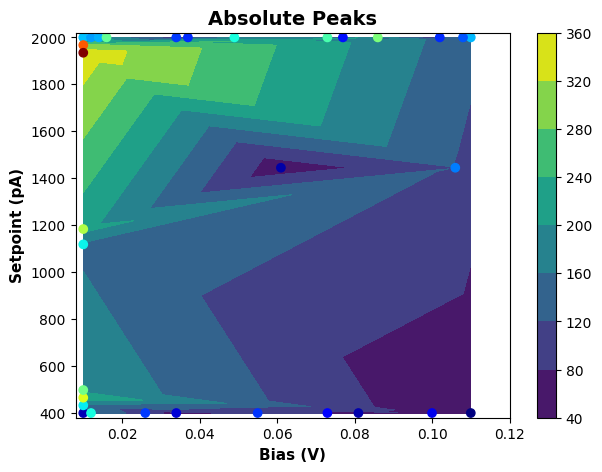

In [11]:
#file_name = "12_Gr_Cu_train_Periodic_1__compilation_final.txt"

!gdown https://drive.google.com/uc?id=1GIseEDnvZP3zZyoREg4xruJj4othvUdj
file_name_1 = "compiled_data.npz"

plt.figure(figsize = (7,5))

xdata = np.load(file_name_1)['bias']
ydata = np.load(file_name_1)['setpoint']
zdata = np.load(file_name_1)['fft_peak']

figure = plt.tricontourf(xdata, ydata, zdata, size = 100)
cbar = plt.colorbar(figure)
figure = plt.scatter(xdata, ydata, c = zdata, marker = 'o', cmap = 'jet')

plt.title('Absolute Peaks', fontsize = 14, fontweight = 'bold')
plt.xlim([0.008, 0.12])
plt.xlabel('Bias (V)', fontsize = 11, fontweight = 'bold')
plt.ylim([380, 2020])
plt.ylabel('Setpoint (pA)', fontsize = 11, fontweight = 'bold')


[0.1] [400.0] [72.295] []
step:  1
Sample #2


maximum y_means, trainY_max = (tensor(33.7153), tensor(72.2950, dtype=torch.float64))
acq_val = 0.0027873944491147995
[2064.] 2064
[0.1, 0.09399999678134918] [400.0, 857.1430053710938] [72.295 54.729] [2064]
step:  1
Sample #3


maximum y_means, trainY_max = (tensor(40.7154), tensor(72.2950, dtype=torch.float64))
acq_val = 0.007139630615711212
[2064 1100] 1100
[0.1, 0.09399999678134918, 0.054999999701976776] [400.0, 857.1430053710938, 400.0] [72.295 54.729 57.699] [2064, 1100]
step:  1
Sample #4


maximum y_means, trainY_max = (tensor(45.7327), tensor(72.2950, dtype=torch.float64))
acq_val = 0.011269982904195786
[2064 1100 2450] 2450
[0.1, 0.09399999678134918, 0.054999999701976776, 0.10999999940395355] [400.0, 857.1430053710938, 400.0, 400.0] [72.295 54.729 57.699 93.684] [2064, 1100, 2450]
step:  1
Sample #5


maximum y_means, trainY_max = (tensor(56.4551), tensor(93.6840, dtype=torch.float64))
acq_val = 0.006870325654745102
[2064 1100 24

<ipython-input-40-5192b9dad0b4>:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(ncols=2,figsize=(12,5))


maximum y_means, trainY_max = (tensor(161.0965), tensor(287.2360, dtype=torch.float64))
acq_val = 2.0124934962950647e-06
[2064 1100 2450 2480 2493 1849 2499 2498 1297 2497 2496 1049 2483   22
   21   24    0    1    2   50   49] 49
[0.1, 0.09399999678134918, 0.054999999701976776, 0.10999999940395355, 0.10999999940395355, 0.10999999940395355, 0.08299999684095383, 0.10999999940395355, 0.10999999940395355, 0.061000000685453415, 0.10999999940395355, 0.10999999940395355, 0.050999999046325684, 0.10999999940395355, 0.009999999776482582, 0.009999999776482582, 0.009999999776482582, 0.009999999776482582, 0.009999999776482582, 0.009999999776482582, 0.012000000104308128, 0.009999999776482582] [400.0, 857.1430053710938, 400.0, 400.0, 1379.592041015625, 1804.08203125, 2000.0, 2000.0, 1967.3470458984375, 1934.6939697265625, 1934.6939697265625, 1902.041015625, 2000.0, 1477.551025390625, 1118.366943359375, 1085.7139892578125, 1183.6739501953125, 400.0, 432.65301513671875, 465.3059997558594, 400.0, 2000

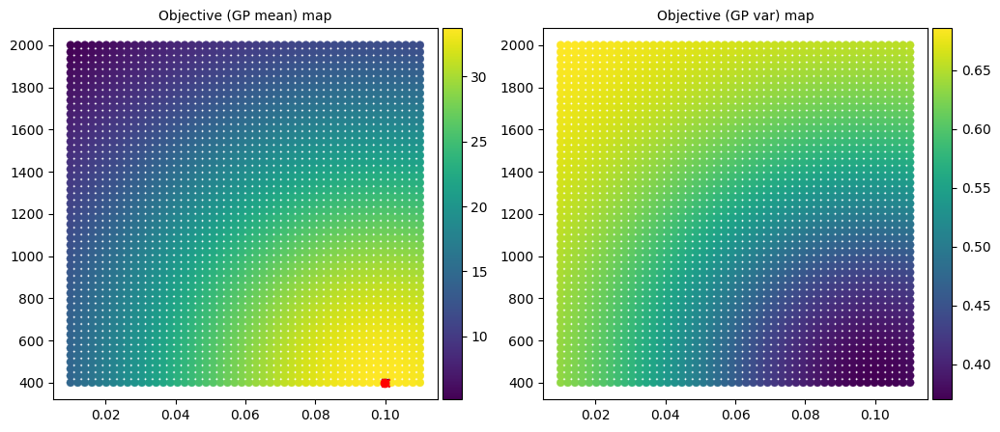

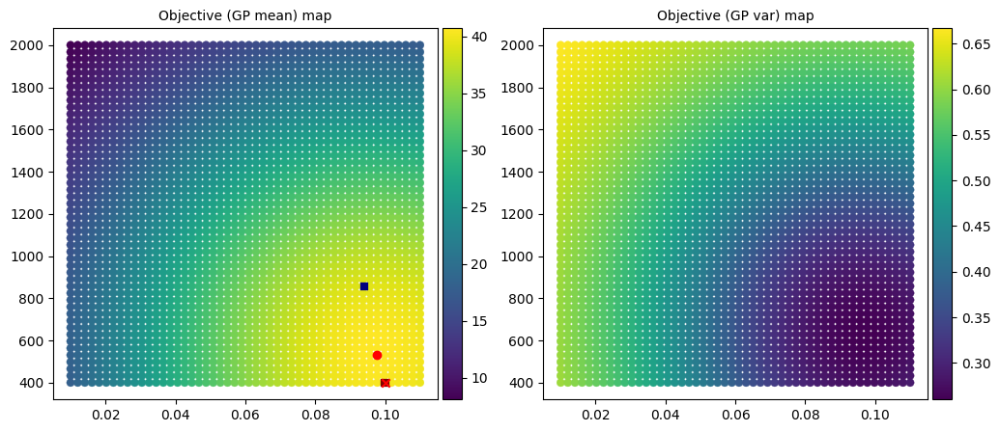

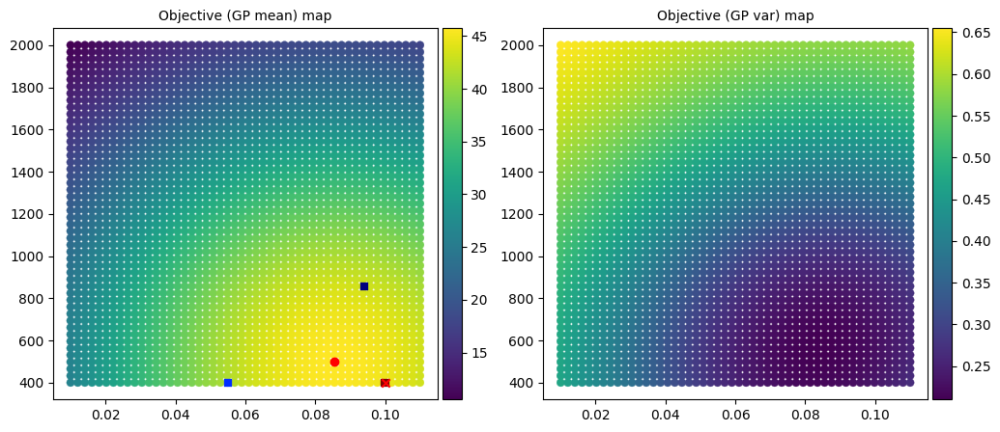

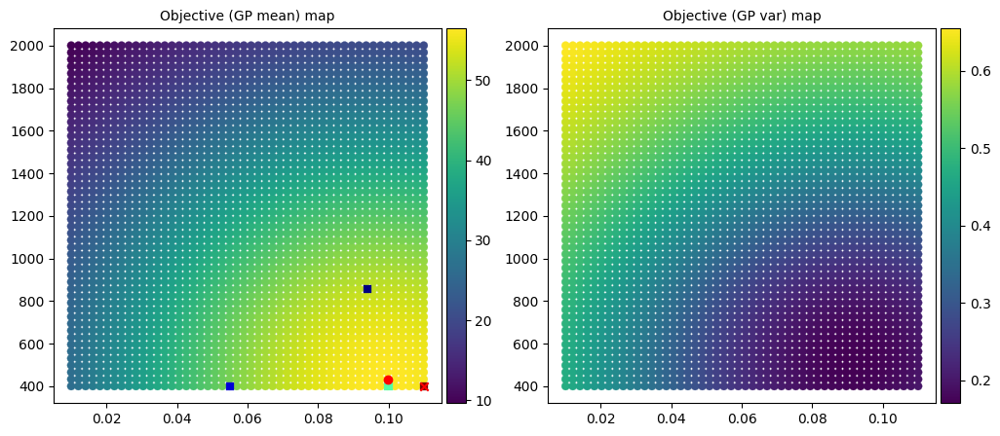

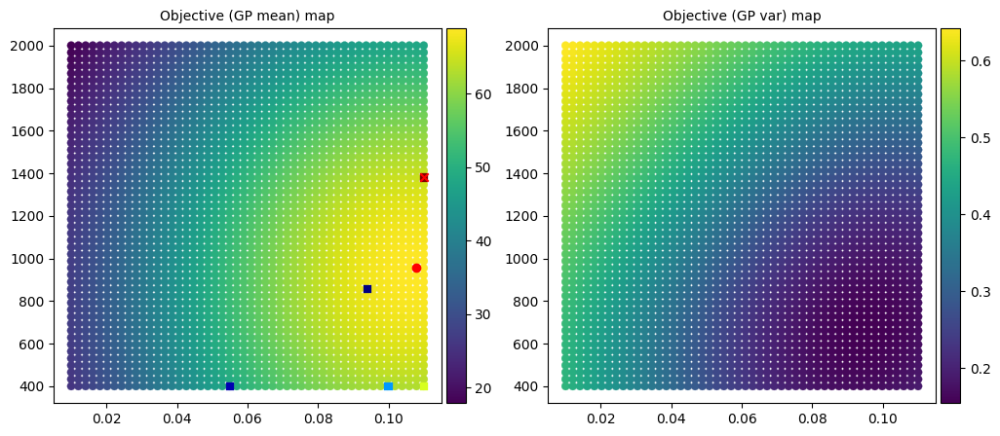

...

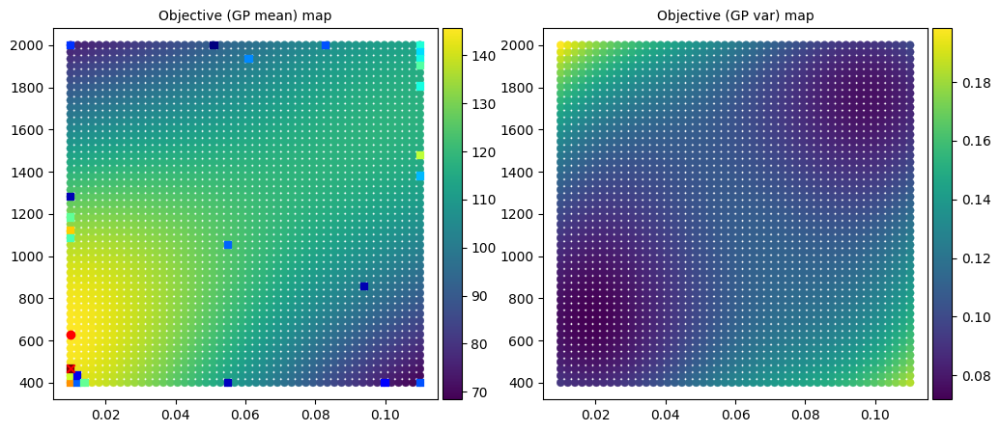

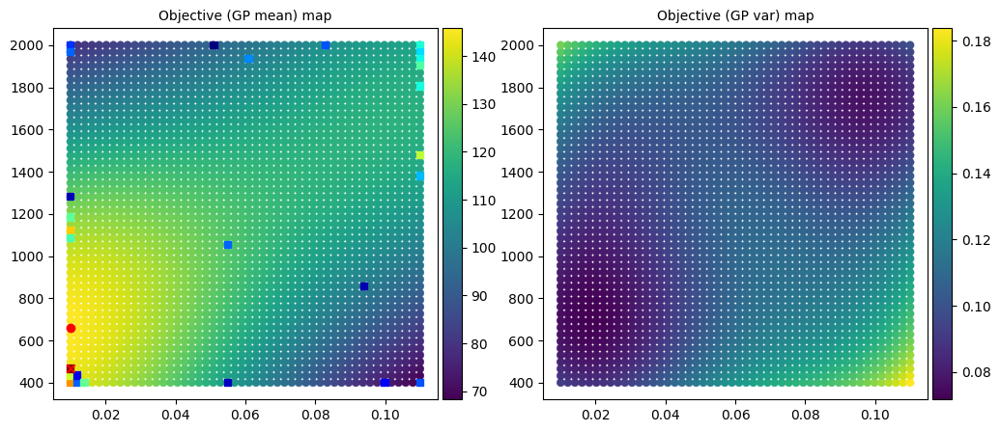

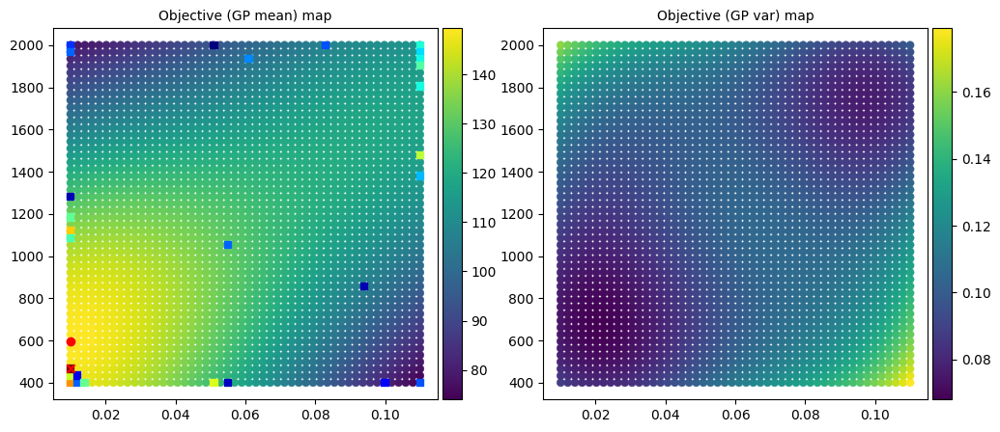

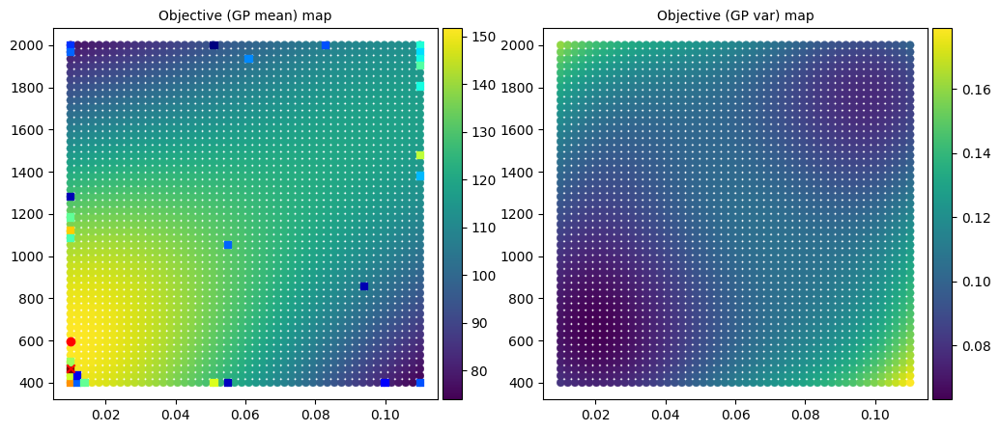

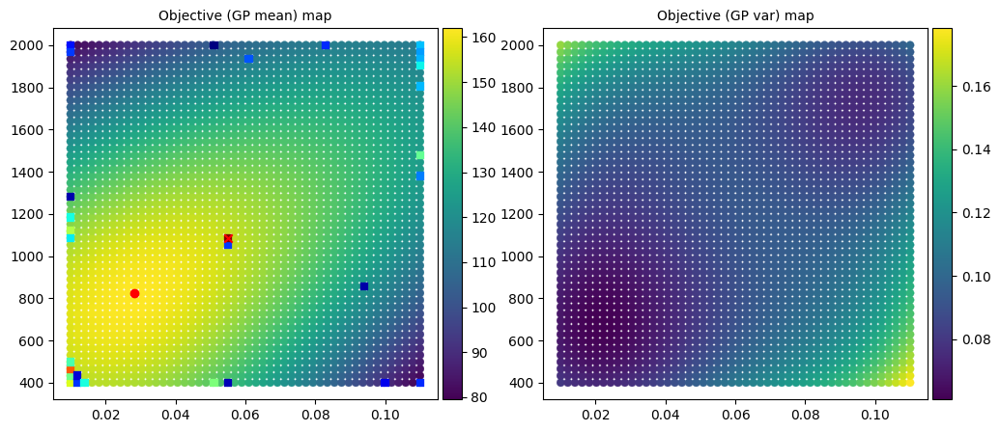

In [41]:
#toy model of the experiment

fft_array = np.load(file_name_1)['fft_peak']
bias = []
setpoint = []
fft_peaks = []
index_1 = []

for i in range(len(fft_array)):

  if i == 0:
    bias.append(np.load(file_name_1)['bias'][0])
    setpoint.append(np.load(file_name_1)['setpoint'][0])
  else:
    #print(bias, setpoint, fft_peaks, index_1)
    op = parameter_prediction(bias, setpoint, fft_peaks, index_1)

    bias.append(op[0])
    setpoint.append(op[1])
    index_1.append(int(op[2]))

  fft_peaks = fft_array[0:i+1]
